# Import Libraries

Tensorflow Keras

In [14]:
from tf_keras import layers
from tf_keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, save_img
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

PyTorch Torchvision

In [272]:
import os
import torch
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image
from torchvision.transforms import v2
from torchvision.io import read_image

torch.manual_seed(1)
pd.set_option('display.max_colwidth', None)

# Load Dataset

In [317]:
# Dataset paths
dataset_dir = '../data'
interim_dir = f'{dataset_dir}/interim'
preprocessed_dir = f'{interim_dir}/emeowtions-preprocessed-v2'
augmentations_dir = f'{interim_dir}/emeowtions-augmentations-v1'
processed_dir = f'{dataset_dir}/processed'

# Sets
preprocessed_train_dir = f'{preprocessed_dir}/train'
processed_train_dir = f'{processed_dir}/train'

# Label files
label_file = f'{processed_train_dir}/labels.csv'

# Image paths
preprocessed_image_dir = f'{preprocessed_train_dir}/images'
augmentations_image_dir = f'{augmentations_dir}/images'
processed_image_dir = f'{processed_train_dir}/images'

# Load labels CSV file
df_labels = pd.read_csv(label_file)

# Previews

## Helper functions

In [282]:
def plot_preview(img, transforms, rows, cols, title):
    num_augmentation = (rows * cols)

    plt.figure(figsize=(10, 10))

    # Original image
    plt.subplot(rows, cols, 1)
    plt.imshow(img.permute([1, 2, 0]))
    plt.title(f'{title} - Original')

    # Augmentations
    for i in range(2, num_augmentation + 1):
        out = transforms(img)
        out = out.permute([1, 2, 0])
        plt.subplot(rows, cols, i)
        plt.imshow(out)

    plt.tight_layout()
    plt.show()

def augment_image(img_path, transforms, num_augmentation):
    augmented_img_list = []

    # Read image
    img = read_image(img_path)

    # Augment image
    for i in range(num_augmentation):
        augmented_img = transforms(img)
        augmented_img_list.append(augmented_img)

    return augmented_img_list

Keras ImageDataGenerator

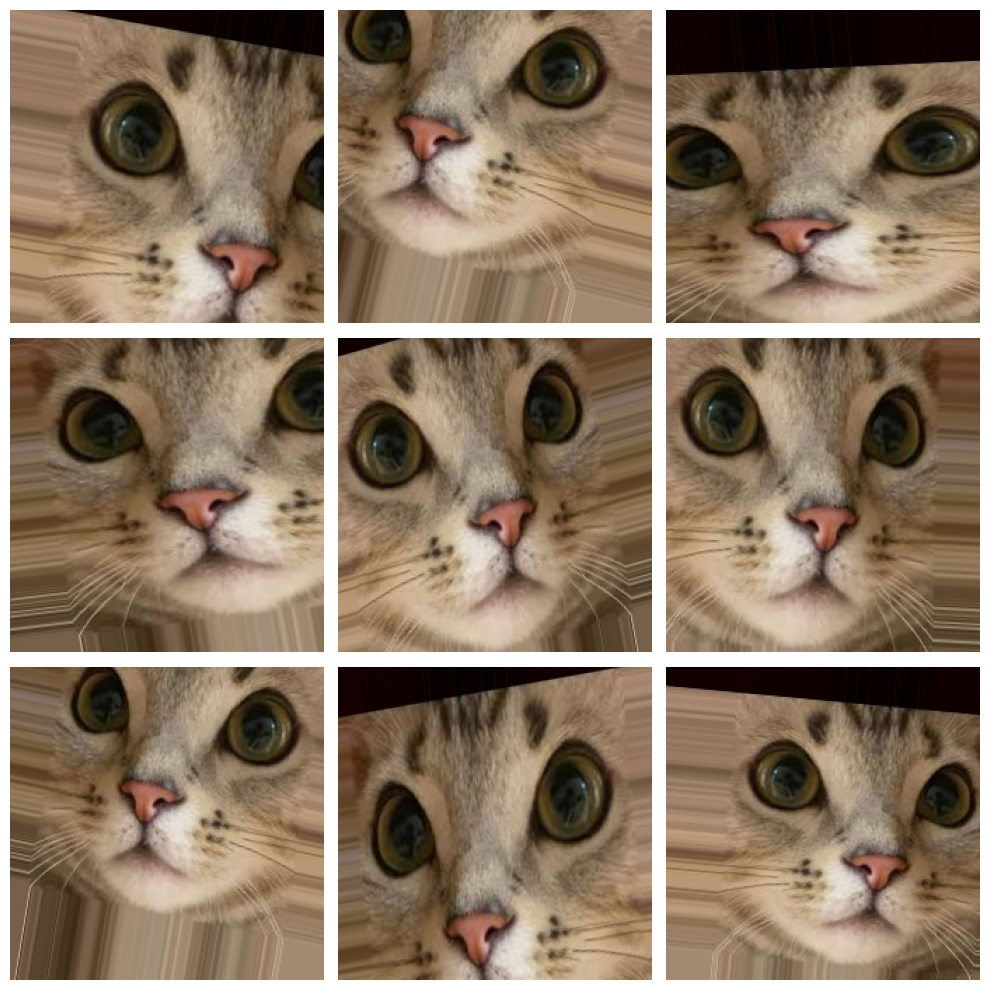

In [107]:
# ImageDataGenerator for augmentation
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

image = load_img(f'{preprocessed_image_dir}/eyes_large_pupils_29_jpg.rf.9f27064ca33d7c376b674a0da50da4b5.jpg')
x = img_to_array(image)
x = x.reshape((1,) + x.shape)

# Generate batches of augmented images
aug_iter = datagen.flow(x, batch_size=1)

# Generate and plot augmented images
plt.figure(figsize=(10, 10))
for i in range(9):
    # Get a batch of augmented images
    aug_image = next(aug_iter)[0].astype('uint8')
    # Plot the image
    plt.subplot(3, 3, i + 1)
    plt.imshow(aug_image)
    plt.axis('off')

plt.tight_layout()
plt.show()

Torchvision Compose

In [271]:
img_name = 'tail_neutral_1_jpg.rf.df09587589b6e748a442f81624be277a.jpg'
img = read_image(f'{preprocessed_image_dir}/{img_name}')
print(f"{type(img) = }, {img.dtype = }, {img.shape = }")

nrow, ncol = 3, 3

type(img) = <class 'torch.Tensor'>, img.dtype = torch.uint8, img.shape = torch.Size([3, 224, 224])


## Geometric Transforms

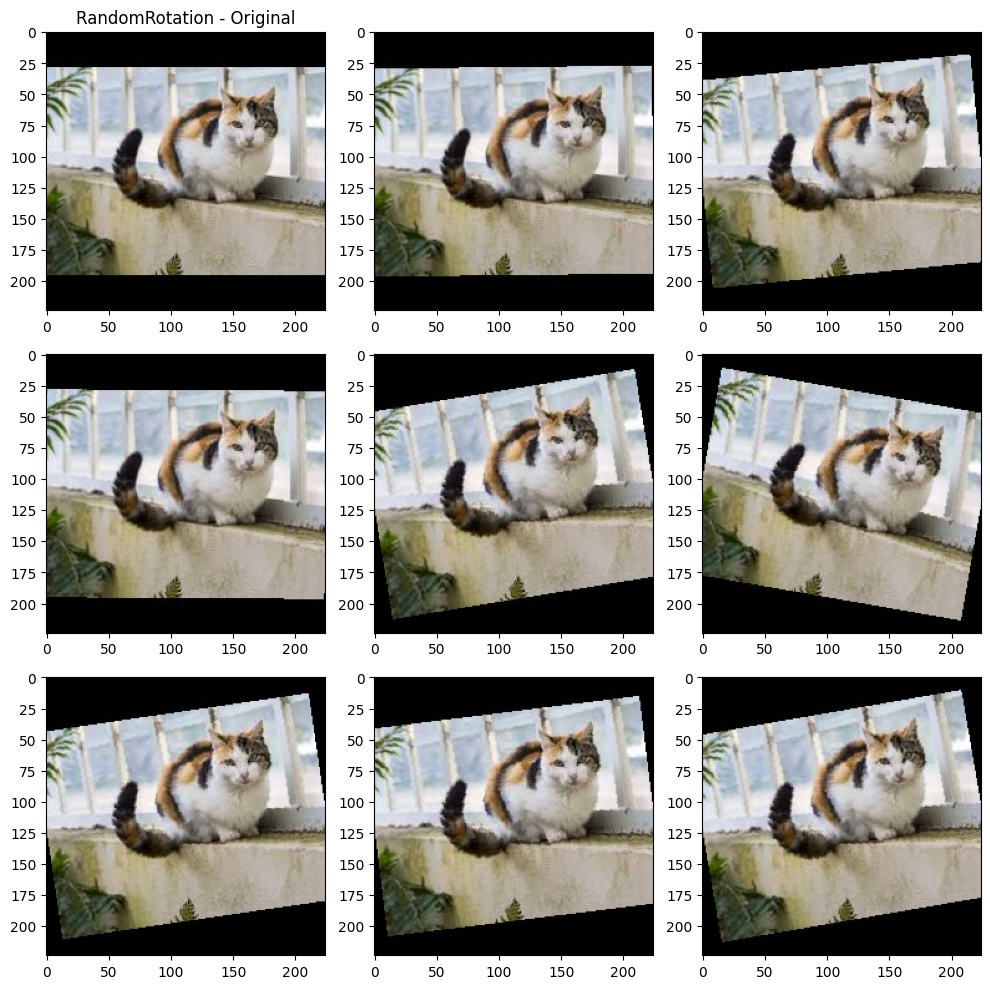

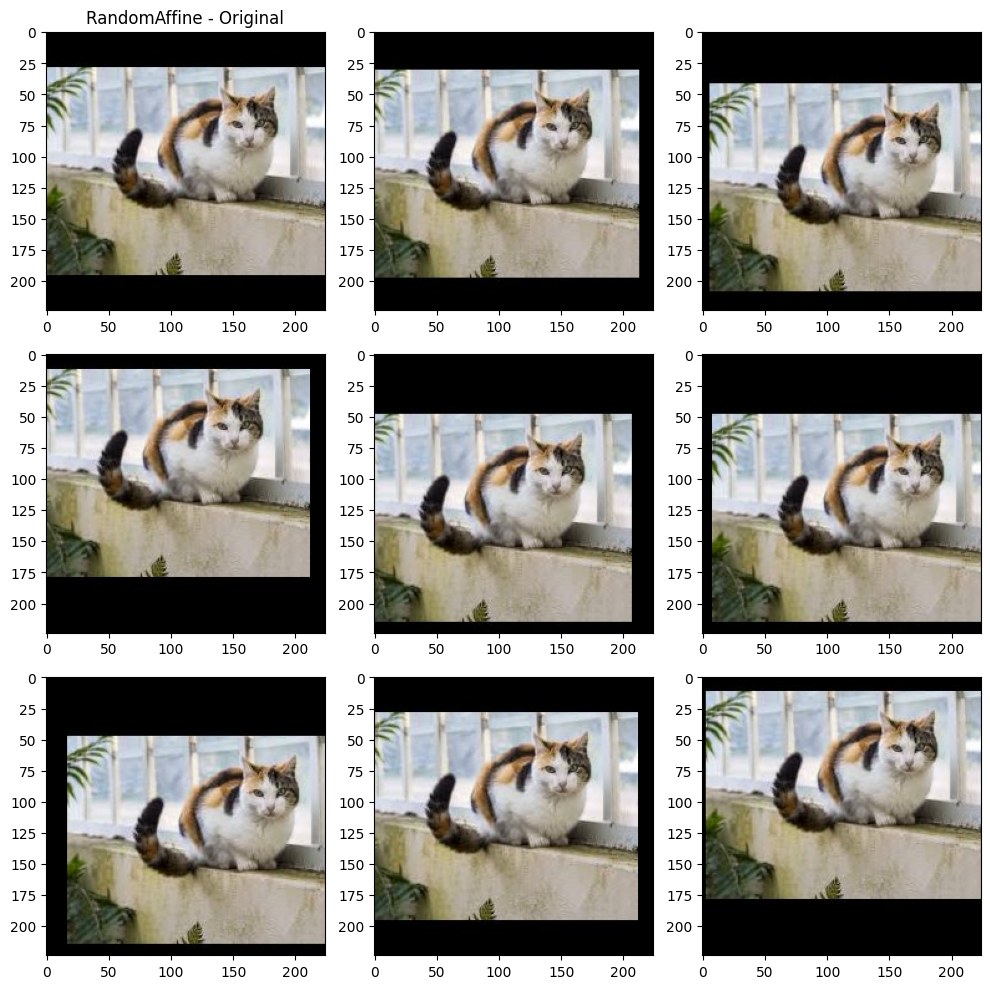

In [261]:
# RandomRotation
transforms = v2.Compose([
    v2.RandomRotation(degrees=(-10, 10))
])
plot_preview(img, transforms, nrow, ncol, 'RandomRotation')

# RandomAffine
transforms = v2.Compose([
    v2.RandomAffine(degrees = 0, translate = (0.1, 0.1))
])
plot_preview(img, transforms, nrow, ncol, 'RandomAffine')

## Photometric Transforms

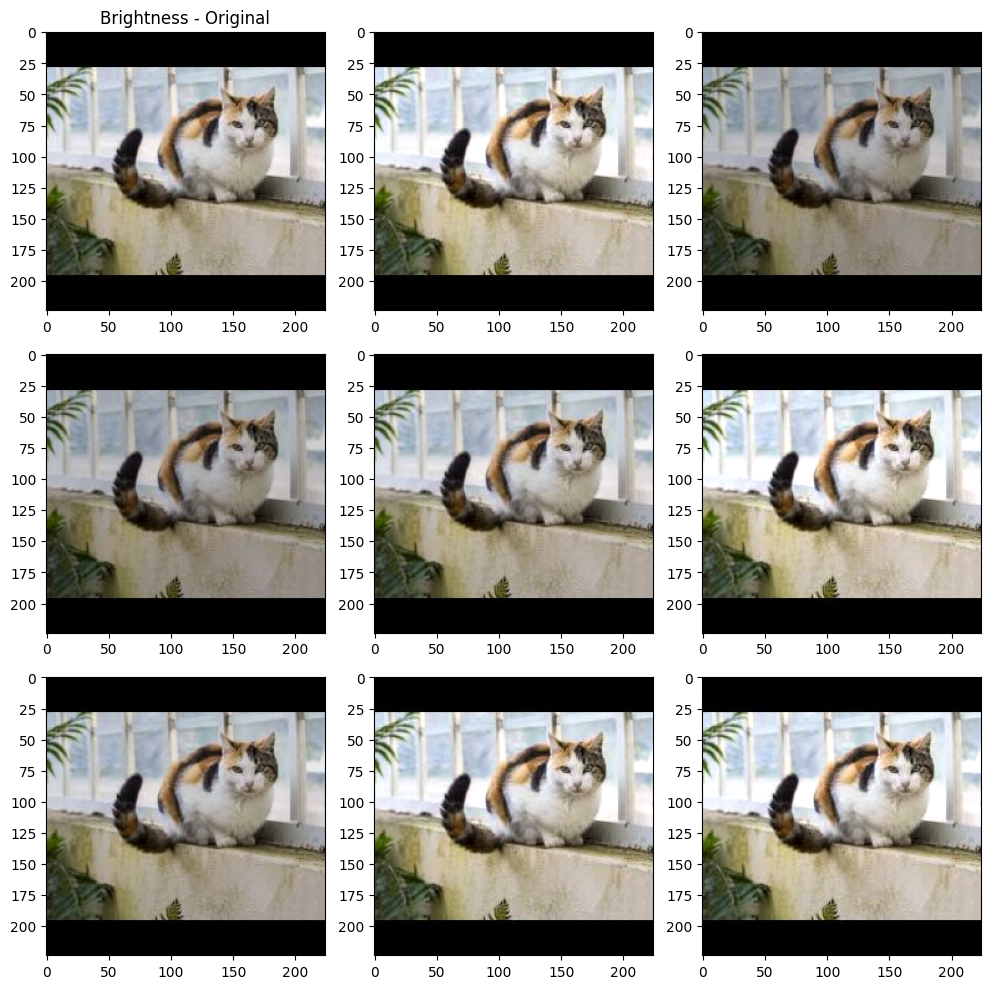

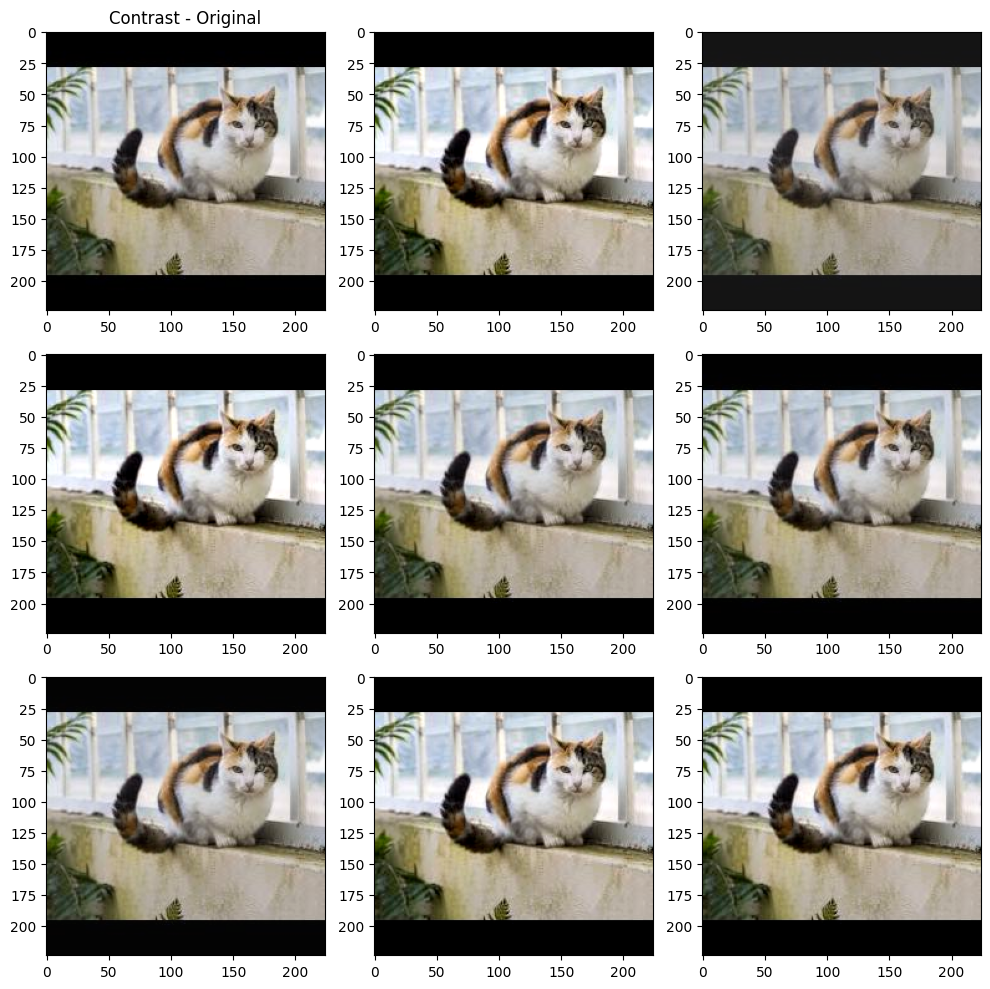

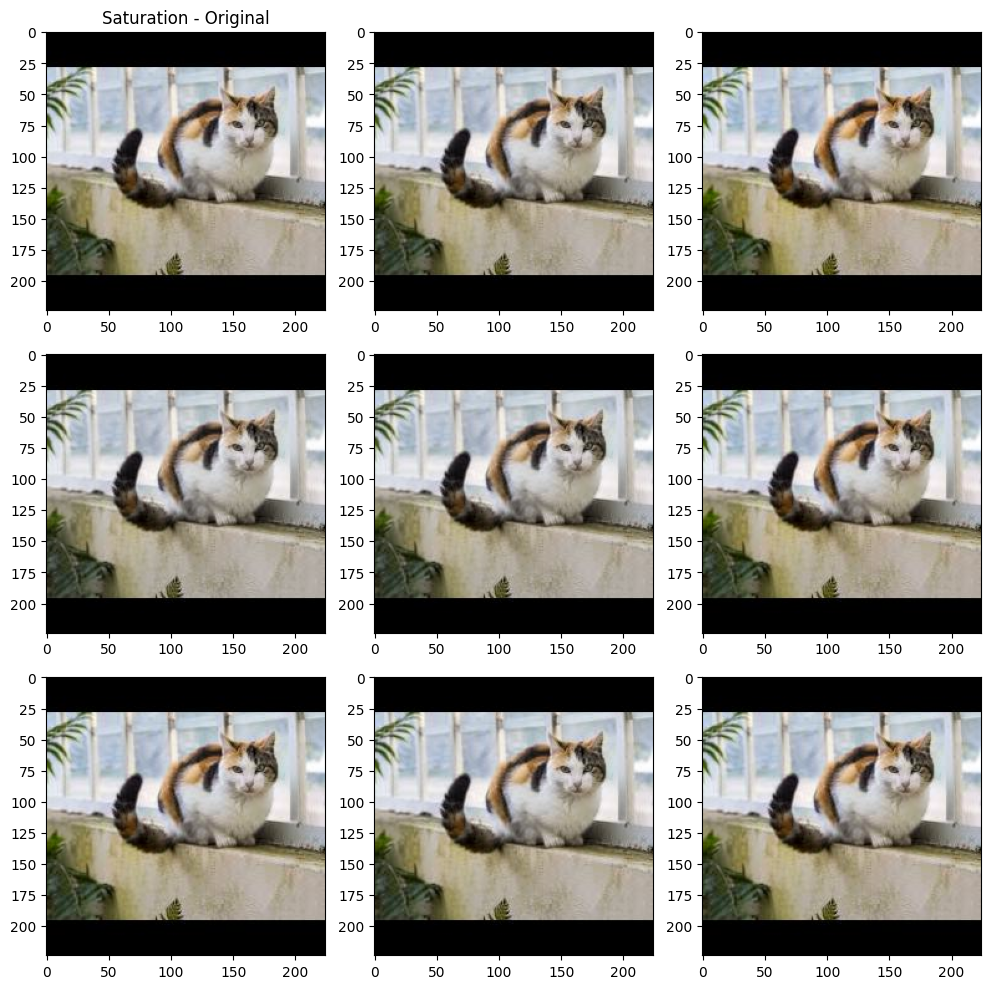

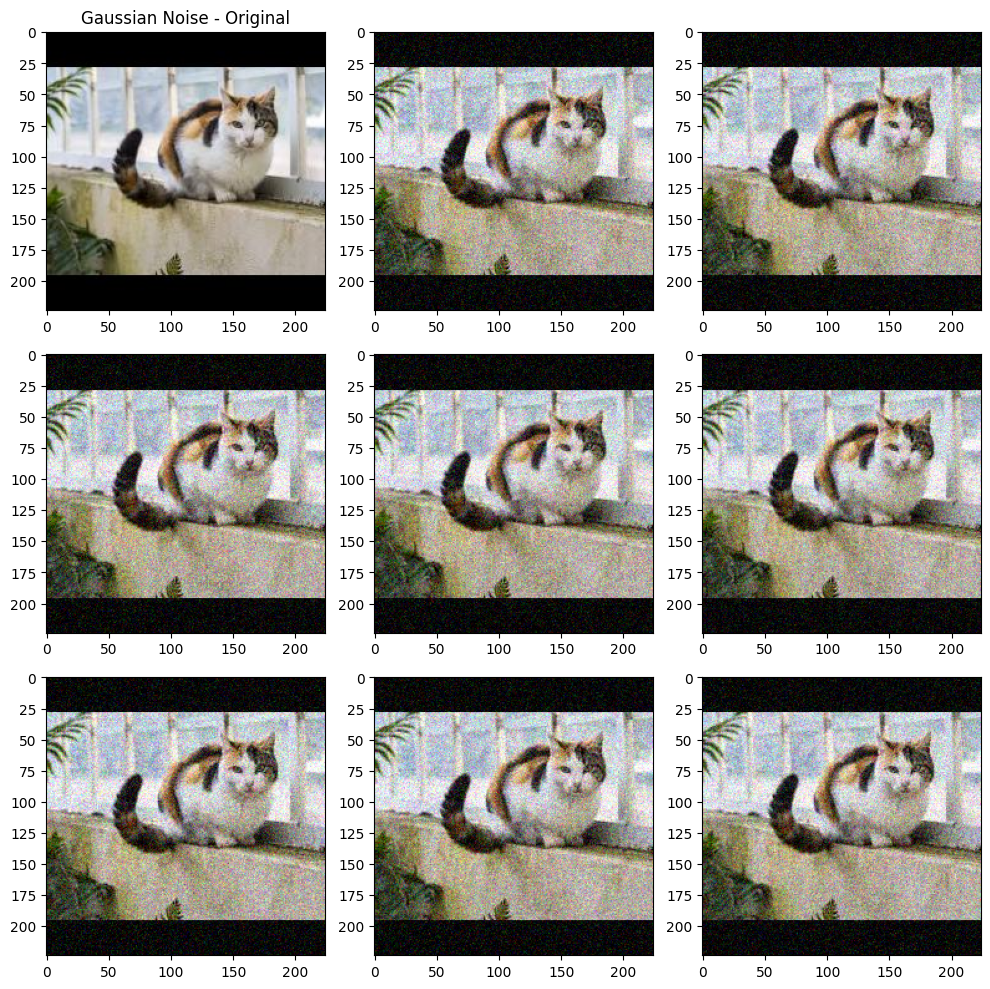

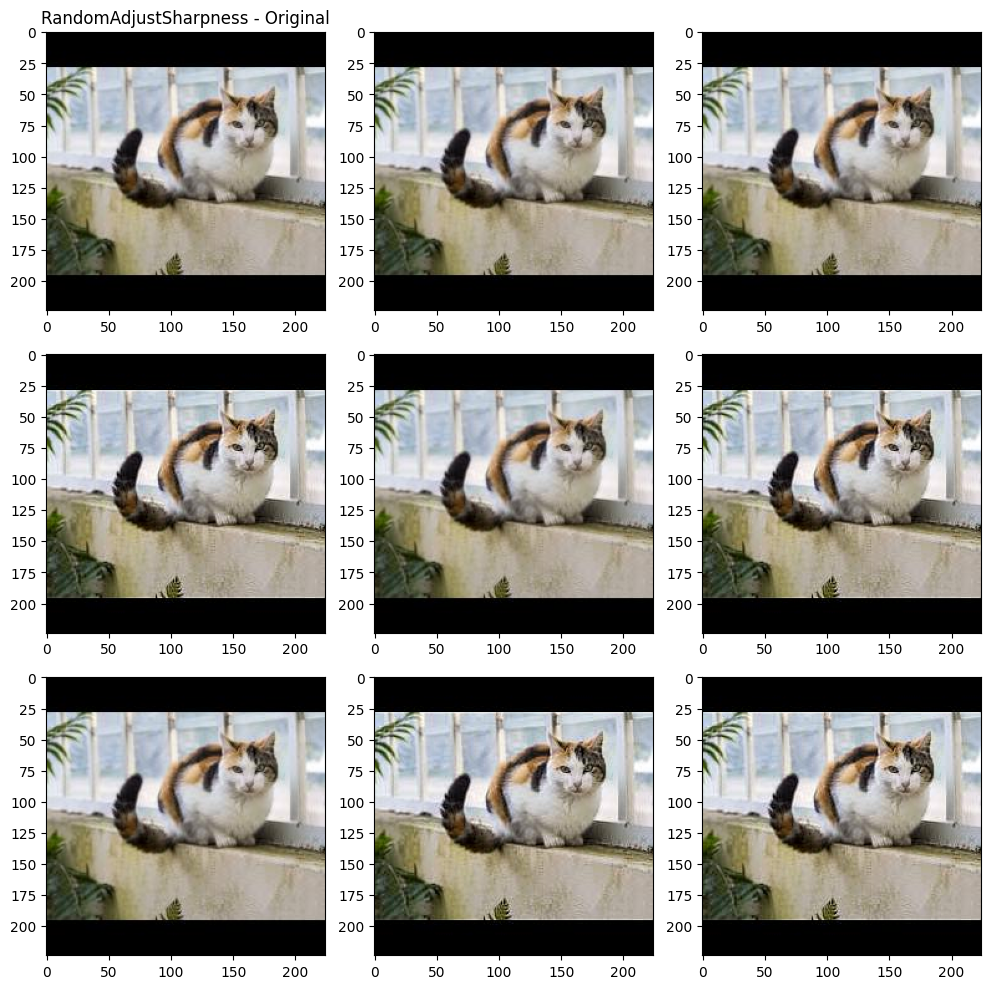

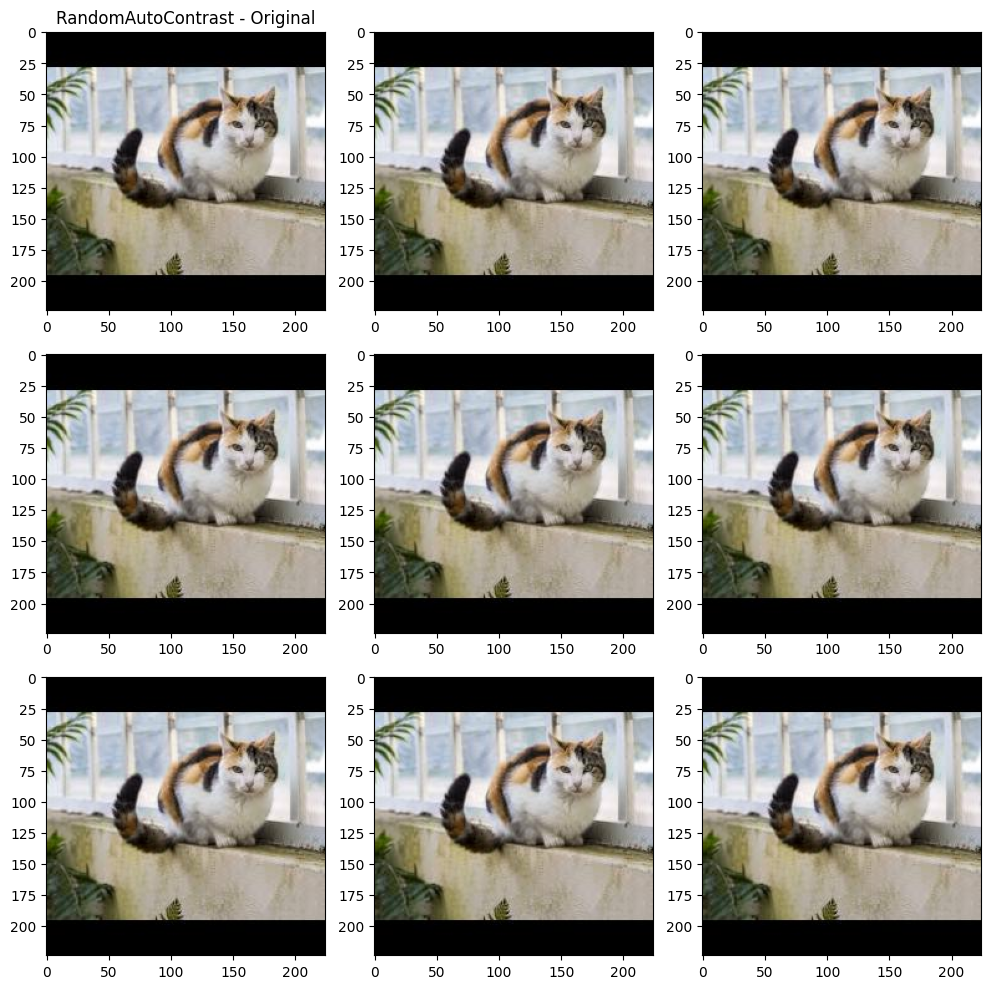

In [252]:
# Brightness
transforms = v2.Compose([
    v2.ColorJitter(brightness=[0.8, 1.2]),
])
plot_preview(img, transforms, nrow, ncol, 'Brightness')

# Saturation
transforms = v2.Compose([
    v2.ColorJitter(contrast=[0.8, 1.2])
])
plot_preview(img, transforms, nrow, ncol, 'Contrast')

# Saturation
transforms = v2.Compose([
    v2.ColorJitter(saturation=[0.75, 1.25])
])
plot_preview(img, transforms, nrow, ncol, 'Saturation')

# Gaussian Noise
transforms = v2.Compose([
    v2.ToTensor(),
    v2.ConvertImageDtype(torch.float32)
    v2.GaussianNoise(),
])
plot_preview(img, transforms, nrow, ncol, 'Gaussian Noise')

# RandomAdjustSharpness
transforms = v2.Compose([
    v2.RandomAdjustSharpness(sharpness_factor=2)
])
plot_preview(img, transforms, nrow, ncol, 'RandomAdjustSharpness')

# RandomAutocontrast
transforms = v2.Compose([
    v2.RandomAutocontrast()
])
plot_preview(img, transforms, nrow, ncol, 'RandomAutoContrast')

## Randomly-applied Transforms

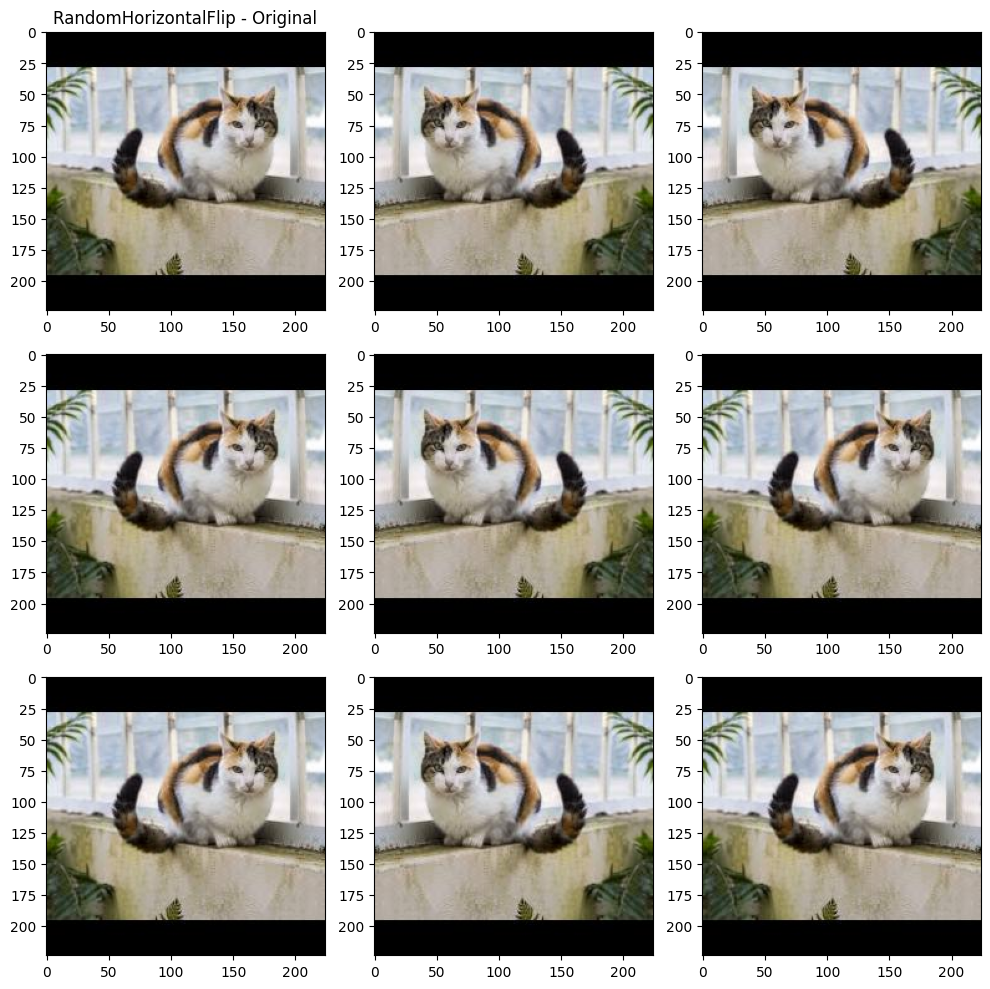

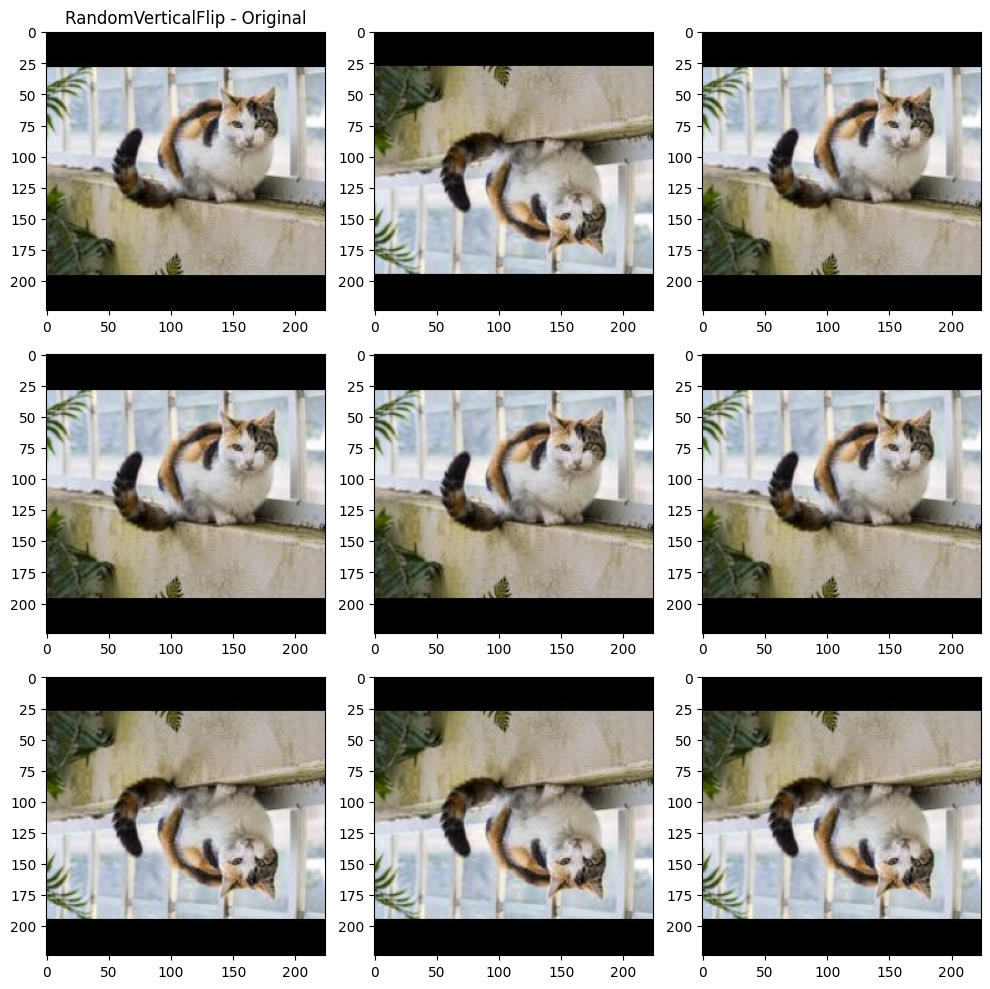

In [244]:
# RandomHorizontalFlip
transforms = v2.Compose([
    v2.RandomHorizontalFlip()
])
plot_preview(img, transforms, nrow, ncol, 'RandomHorizontalFlip')

# RandomVerticalFlip
transforms = v2.Compose([
    v2.RandomVerticalFlip()
])
plot_preview(img, transforms, nrow, ncol, 'RandomVerticalFlip')

# Augmentation

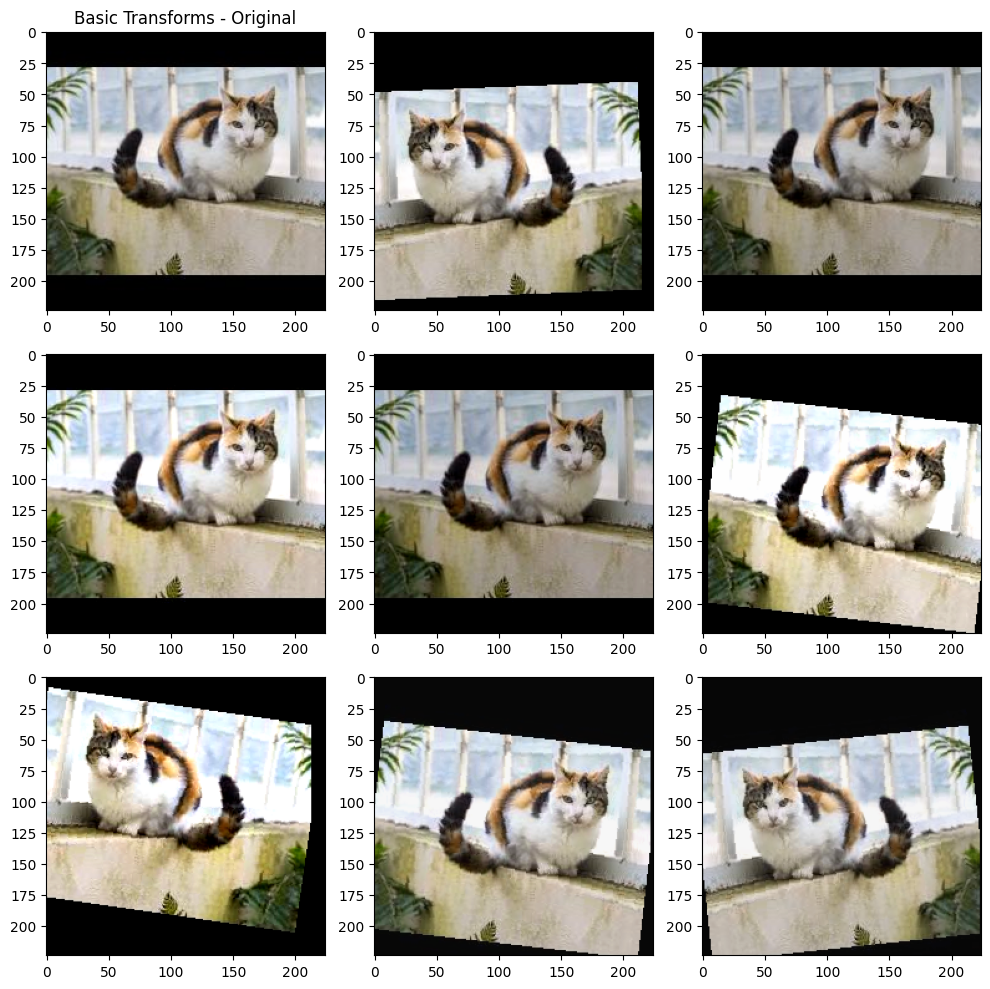

In [267]:
'''
Augmentations
- Rotation
- Width shift, height shift
- Horizontal flip
- Brightness
- Contrast
- Saturation
'''
basic_transforms = v2.Compose([
    v2.RandomApply(
        transforms=[
            v2.RandomRotation(degrees=[-10, 10]),
            v2.RandomAffine(degrees = 0, translate = (0.1, 0.1)),
            v2.RandomHorizontalFlip()
        ],
        p=0.5
    ),
    v2.ColorJitter(brightness=[0.8, 1.2]),
    v2.ColorJitter(contrast=[0.8, 1.2]),
    v2.ColorJitter(saturation=[0.75, 1.25]),
])

plot_preview(img, basic_transforms, nrow, ncol, 'Basic Transforms')

In [320]:
save_dir = augmentations_image_dir  # Location to save augmented images
augmented_labels_list = [] # List to store augmented image labels
num_augmentation = 5  # Number of times to augment each image
total_augmentation = 0  # Total number of augmented images generated

for idx, row, in df_labels.iterrows():
    # Get image filename, path, and extension
    img_path = os.path.join(processed_image_dir, row['filename'])
    original_filename, extension = os.path.splitext(os.path.basename(img_path))

    print(f'Augmenting {row["filename"]}')

    # Augment image
    augmented_imgs = augment_image(img_path, basic_transforms, num_augmentation)

    # Save augmented image and add label copies
    augmentation_count = 1
    for augmented_img in augmented_imgs:
        # Save image
        new_filename = f'{original_filename}_aug{augmentation_count}{extension}'
        augmented_img_path = os.path.join(save_dir, new_filename)
        augmented_img = v2.ToPILImage()(augmented_img)
        augmented_img.save(augmented_img_path)

        # Copy labels
        labels_copy = row.copy()
        labels_copy['filename'] = new_filename
        augmented_labels_list.append(labels_copy)

        augmentation_count += 1
        total_augmentation += 1

print('Total number of augmentations generated:', total_augmentation)

# Update labels file with augmented images
df_augmented_labels = pd.DataFrame(augmented_labels_list)
df_combined_labels = pd.concat([df_labels, df_augmented_labels], ignore_index=True)
df_combined_labels.to_csv(f'{augmentations_dir}/labels.csv', encoding='utf-8', index=False, header=True)

Augmenting mouth_fangs_51_jpg.rf.2124182b04138821518be4c8fc254e44.jpg
Augmenting posture_small_165_jpg.rf.222ee8cda11c49f1f6ad327eb3c3dab1.jpg
Augmenting ears_flat_17_jpg.rf.23ac64ea52b5a1f7068f5dd65467be0a.jpg
Augmenting mouth_fangs_72_jpg.rf.2291ba8435f63ee98517d4d12574b9c6.jpg
Augmenting eyes_small_pupils_147_jpg.rf.22b7f0c059926bd5eb7b9c8242c8f9e7.jpg
Augmenting mouth_fangs_144_jpg.rf.2374162caf35571a2894612f2175722d.jpg
Augmenting mouth_fangs_47_jpg.rf.21803d566d0ef5422a39073c0b7dbbb4.jpg
Augmenting tail_up_88_jpg.rf.2725d0974e41b3b0f8706b3637b44a29.jpg
Augmenting eyes_large_pupils_57_jpg.rf.26949c3db437b745d8507a95dcd36ad7.jpg
Augmenting tail_up_64_jpg.rf.22d1a65116feaf5f7e13c4351dc9080b.jpg
Augmenting tail_up_18_jpg.rf.27840d6a07b2619e73a8daa394232f67.jpg
Augmenting eyes_small_pupils_81_png.rf.280a125ab8e73a8d52f53b06e9c96001.jpg
Augmenting posture_exposed_belly_88_jpg.rf.224037c5bbeb175742480281da64b524.jpg
Augmenting posture_stretch_49_jpg.rf.2200926fcc3531e13bb3598bcbc1952c.j